<a href="https://colab.research.google.com/github/pasquale90/mthesis/blob/master/additional/STFTs_Parameters_experiment%5Besc50%5D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
!pip uninstall librosa

In [ ]:
!pip install librosa

In [ ]:
!pip list

In [6]:
#Imports
import os
import pandas as pd
import numpy as np
import librosa
import matplotlib.pyplot as plt
import math
from PIL import Image
from scipy import signal
import scipy as sp
from tqdm import tqdm_notebook as tqdm

In [5]:
#Read the contents 
audio_path='/content/gdrive/My Drive/dissertation/ESC-50-master/audio/'
audio_files=os.listdir(audio_path)
print ('audiofiles length = {}'.format(len(audio_files)))

audiofiles length = 2000


In [61]:
def extract_stfts(audio_path,filename,sr,window_size,overlap,nfft):
  data,fs=librosa.load(path=audio_path+filename,sr=sr,mono=True)
  stft=librosa.core.stft(y=data.astype(float),
                    n_fft=nfft, 
                    hop_length=overlap, 
                    win_length=window_size,
                    window='hann',
                    center=True)
  magnitude = np.abs(stft)
  db_stft = librosa.amplitude_to_db(magnitude,ref=np.max)
  return db_stft

In [36]:
def extract_stfts_2(audio_path,filename,sr):
  data,fs=librosa.load(path=audio_path+filename,sr=sr,mono=True)
  n = len(data)
  freq = np.fft.rfftfreq(n, d=1/sr)#d = periodos tou simatos
  rfft = abs(np.fft.rfft(data)/n)#/n is the normalize factor(n=length of the signal)  
  return (rfft,freq)

In [14]:
def extract_stfts_3(audio_path,filename,sr,window_size,overlap,nfft):
  data,fs=librosa.load(path=audio_path+filename,sr=sr,mono=True)
  n = len(data)
  freq,segtimes,stft=sp.signal.stft(x=data,
                      fs=fs,
                      window='hann',
                      nperseg=window_size,
                      noverlap=overlap, 
                      nfft=nfft, 
                      return_onesided=True, boundary='zeros', 
                      padded=True) 
  return freq,segtimes,stft

In [15]:
def stft_to_image(spec, eps=1e-6):
  mean = spec.mean()
  std = spec.std()
  spec_norm = (spec - mean) / (std + eps)
  spec_min, spec_max = spec_norm.min(), spec_norm.max()
  spec_scaled = 255 * (spec_norm - spec_min) / (spec_max - spec_min)
  spec_scaled = spec_scaled.astype(np.uint8)
  
  return spec_scaled

In [27]:
def save_spec(path,name,spec):
  image = Image.fromarray(spec) 
  image.save(path+name)

In [17]:
def read_image(path,name):#print_info too
  image=Image.open(path+name)
  display(image)
  image=np.array(image)
  
  print(name)
  print(image.shape)
  print(type(image))
  print(image)
  return image

In [63]:
#Parameters
params=np.array([[44100, 512, 512,  128],
                 [44100, 512, 512, 256],
                 [44100, 1024, 512,  256],#(513, 862)
                 [44100, 1024, 1024, 512],#(513, 431)
                 [32000, 1024, 512, 256], 
                 [32000, 1024, 1024, 256], 
                 [22050, 512, 512, 128],
                 [22050, 512, 512, 256], #(257, 431)
                 [22050, 1024, 512, 256],#(513, 431)
                 [22050, 1024, 1024, 512]#(513, 216)
                 ])

experiments = pd.DataFrame(params,index=['exp1', 'exp2', 'exp3','exp4','exp5',
                                         'exp6', 'exp7', 'exp8','exp9','exp10'],
                           columns=['Sample rate','FFT points','Window Size', 'Overlap'])
print(experiments)

       Sample rate  FFT points  Window Size  Overlap
exp1         44100         512          512      128
exp2         44100         512          512      256
exp3         44100        1024          512      256
exp4         44100        1024         1024      512
exp5         32000        1024          512      256
exp6         32000        1024         1024      256
exp7         22050         512          512      128
exp8         22050         512          512      256
exp9         22050        1024          512      256
exp10        22050        1024         1024      512


In [19]:
csvpath='/content/gdrive/My Drive/dissertation/ESC-50-master/meta/esc50.csv'
esc50=pd.read_csv(csvpath)
esc50.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2000 non-null   object
 1   fold      2000 non-null   int64 
 2   target    2000 non-null   int64 
 3   category  2000 non-null   object
 4   esc10     2000 non-null   bool  
 5   src_file  2000 non-null   int64 
 6   take      2000 non-null   object
dtypes: bool(1), int64(3), object(3)
memory usage: 95.8+ KB


In [20]:
classes = np.unique(esc50['category'])
print(classes[0:10])

['airplane' 'breathing' 'brushing_teeth' 'can_opening' 'car_horn' 'cat'
 'chainsaw' 'chirping_birds' 'church_bells' 'clapping']


In [92]:
def plot_experiments(path, stfts, name):
  image=read_image_exp(path,name)
  plt.ioff()
  fig = plt.figure(frameon=False)
  ax = plt.Axes(fig, [0., 0., 1., 1.])
  ax.set_axis_off()
  fig.add_axes(ax)
  ax.set_title(name, y=1.08)
  ax.imshow(image, cmap='gray', aspect='auto')
  plt.close(fig)

def define_imagename_exp(wavname,exp):
  imagename=wavname.split('.')[0]+'_'+exp+'.png'
  return imagename

def read_image_exp(path,name):#print_info too
  image=Image.open(path+name)
  display(image)
  image=np.array(image)
  return image

In [24]:
!mkdir /content/exp
!mkdir /content/exp/stft1
!mkdir /content/exp/stft2
!mkdir /content/exp/stft3

exp1
Class: airplane, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


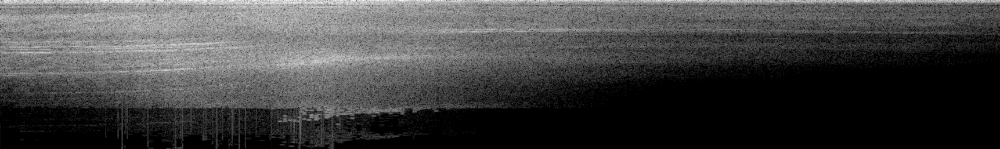

exp2
Class: airplane, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


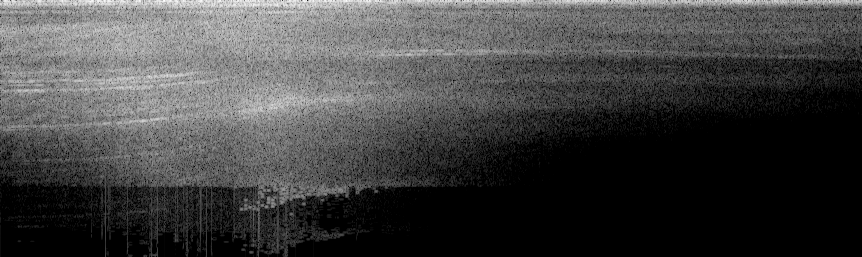

exp3
Class: airplane, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


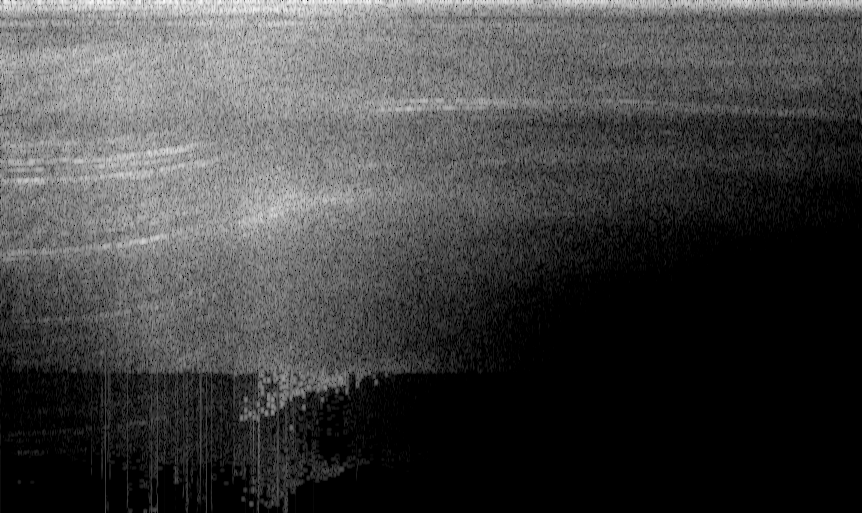

exp4
Class: airplane, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


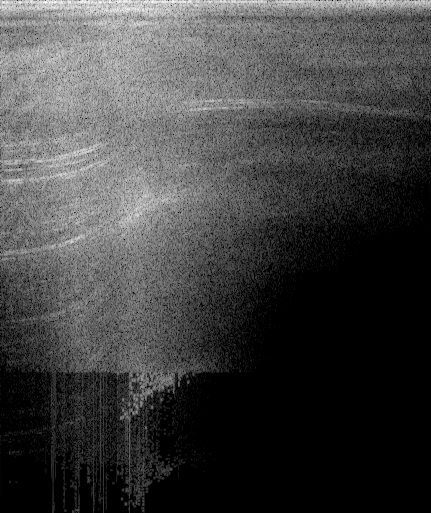

exp5
Class: airplane, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


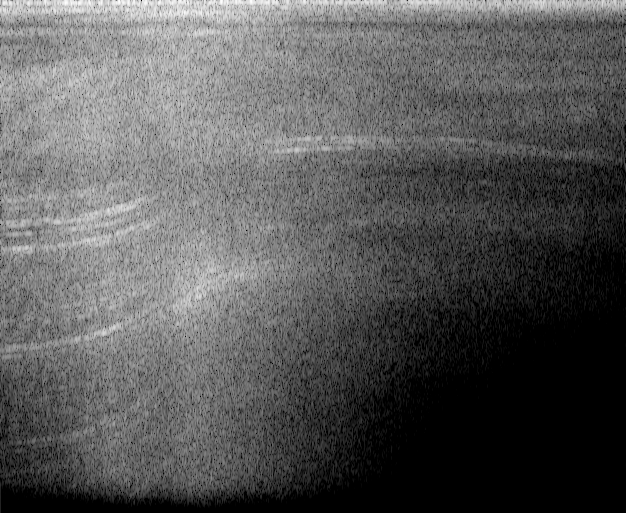

exp6
Class: airplane, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


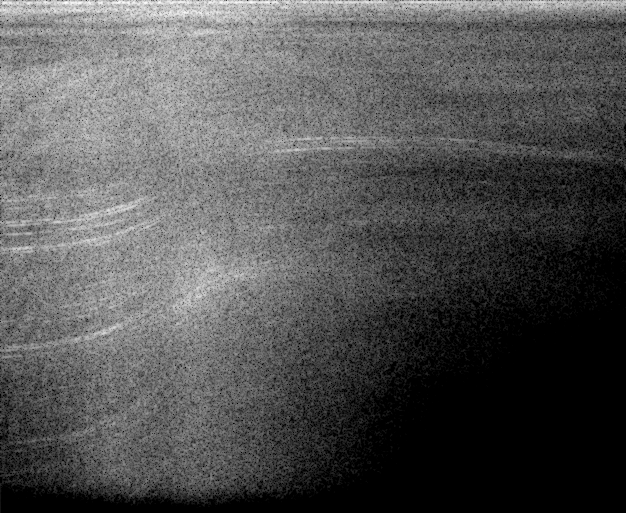

exp7
Class: airplane, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


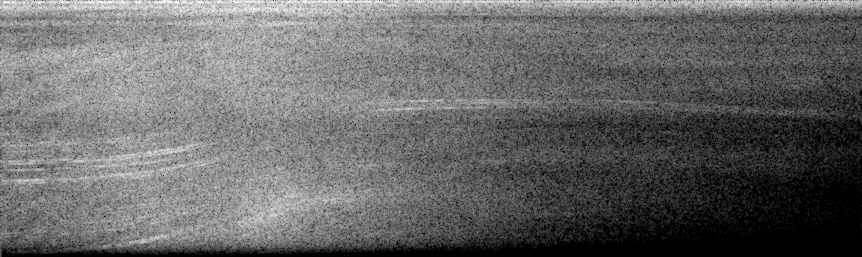

exp8
Class: airplane, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


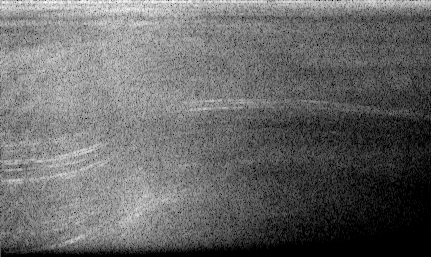

exp9
Class: airplane, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


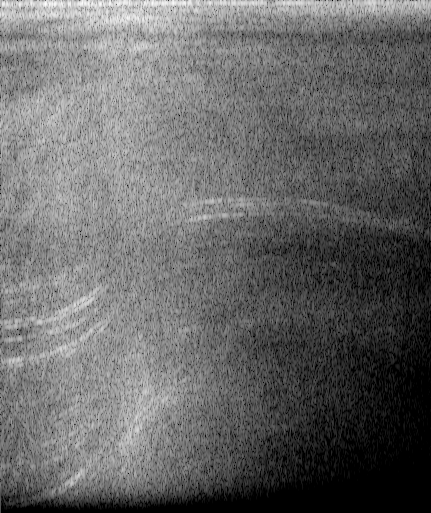

exp10
Class: airplane, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


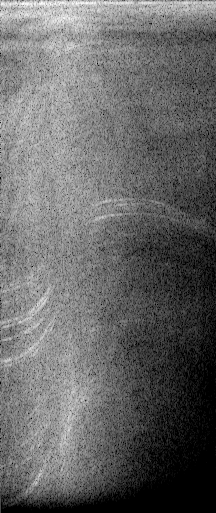

exp1
Class: breathing, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


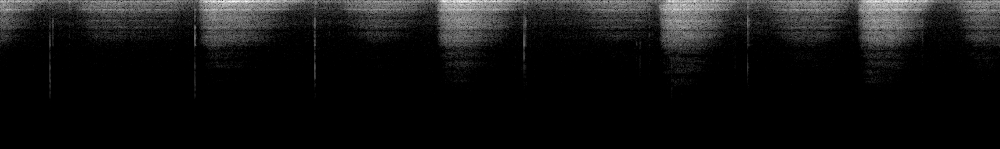

exp2
Class: breathing, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


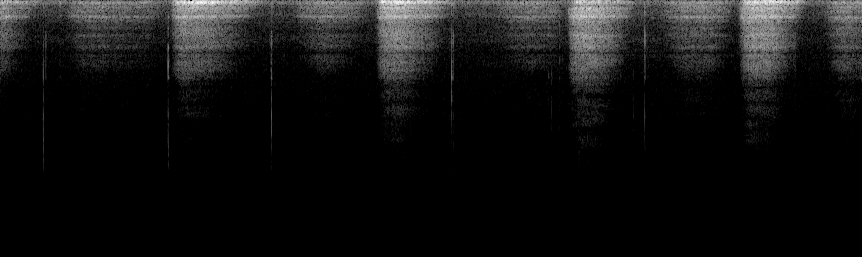

exp3
Class: breathing, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


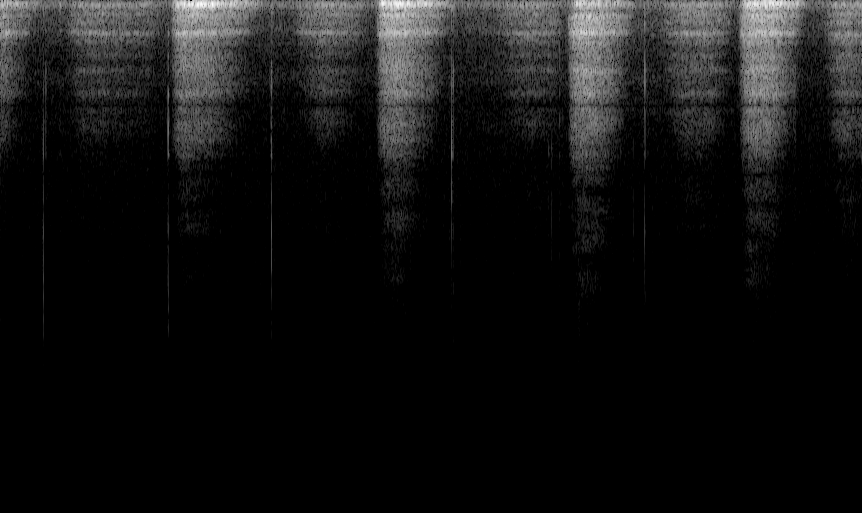

exp4
Class: breathing, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


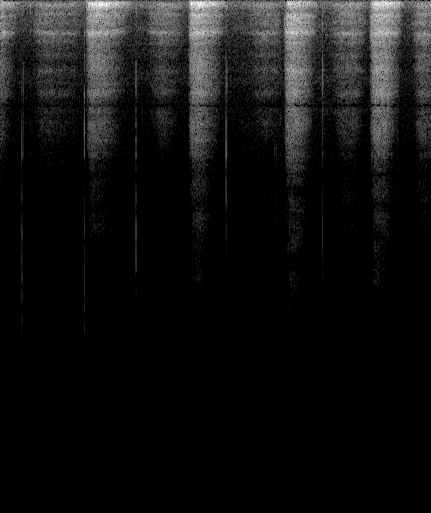

exp5
Class: breathing, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


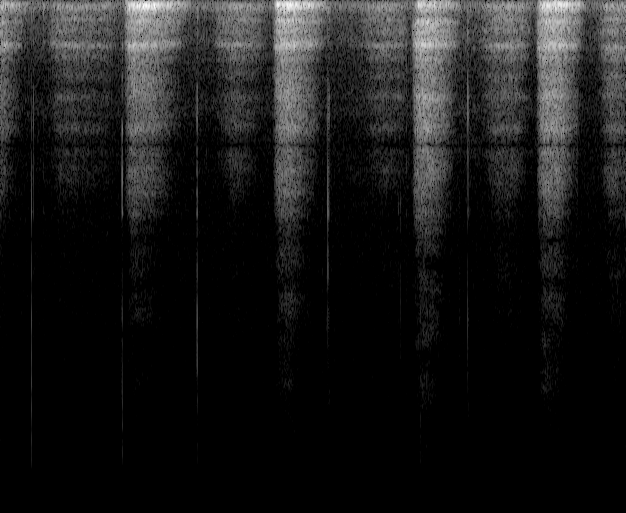

exp6
Class: breathing, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


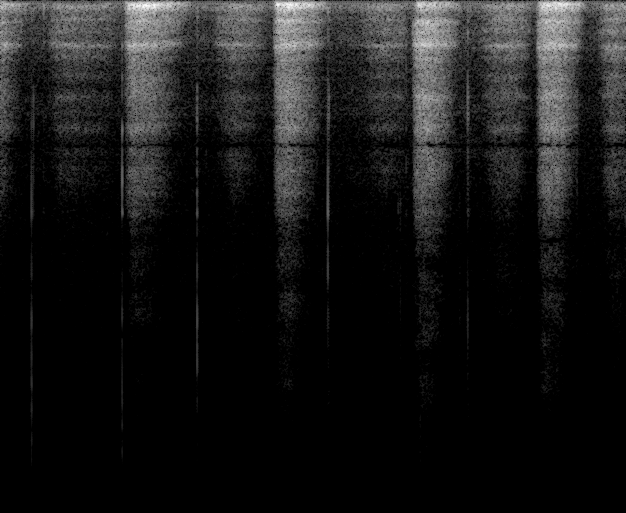

exp7
Class: breathing, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


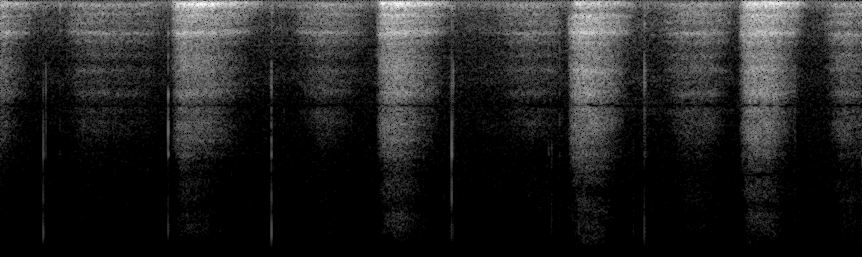

exp8
Class: breathing, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


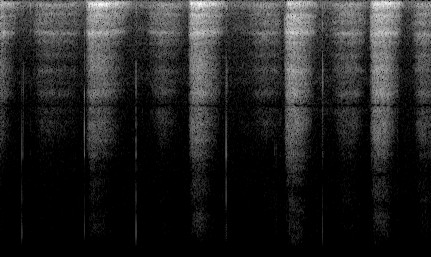

exp9
Class: breathing, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


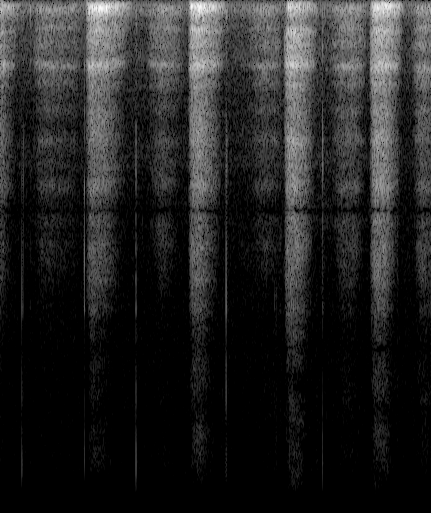

exp10
Class: breathing, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


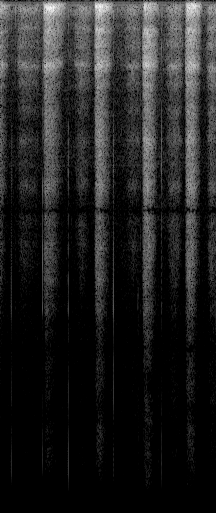

exp1
Class: brushing_teeth, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


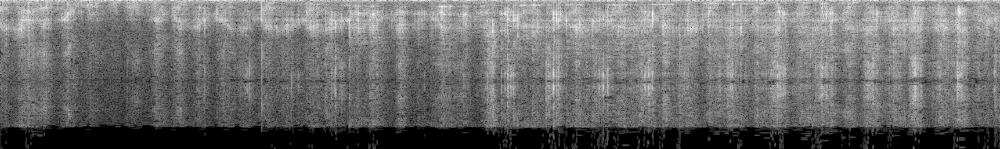

exp2
Class: brushing_teeth, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


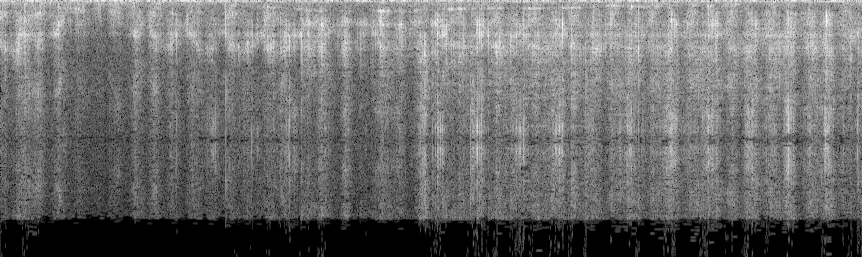

exp3
Class: brushing_teeth, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


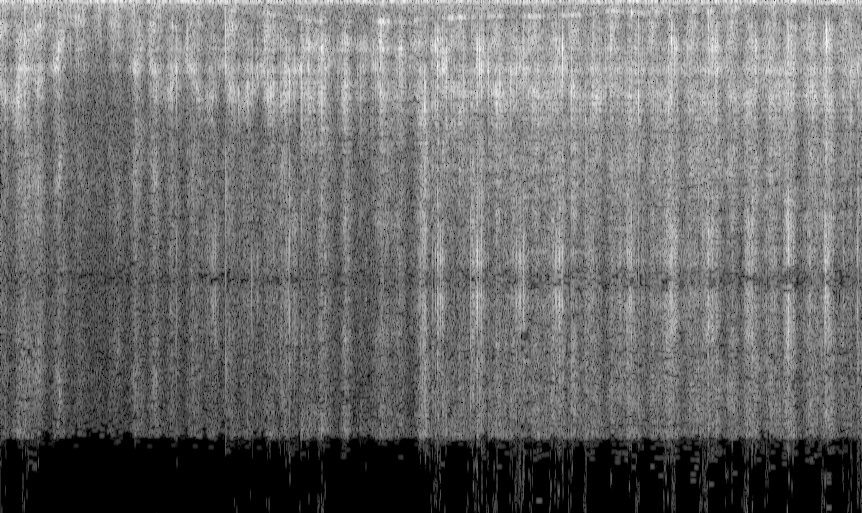

exp4
Class: brushing_teeth, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


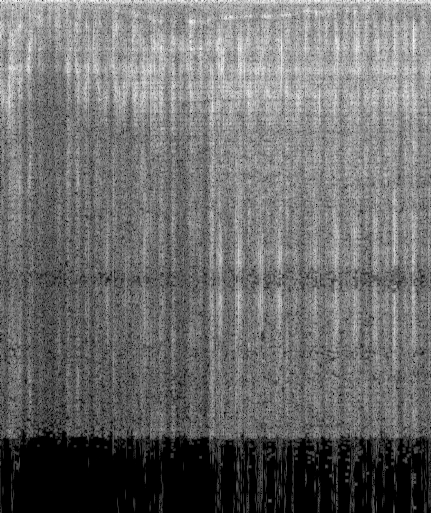

exp5
Class: brushing_teeth, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


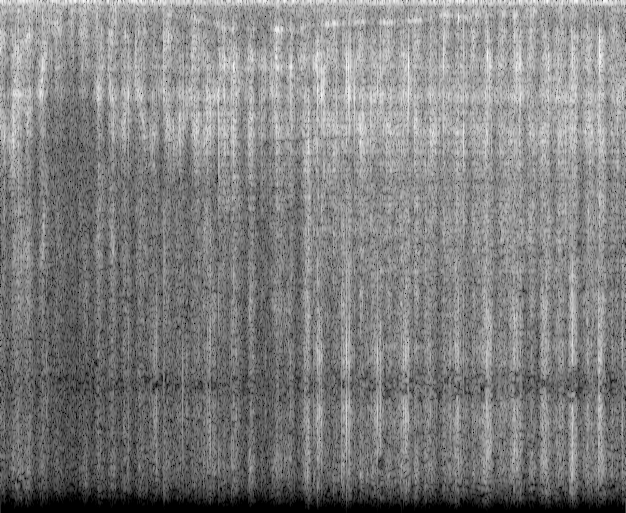

exp6
Class: brushing_teeth, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


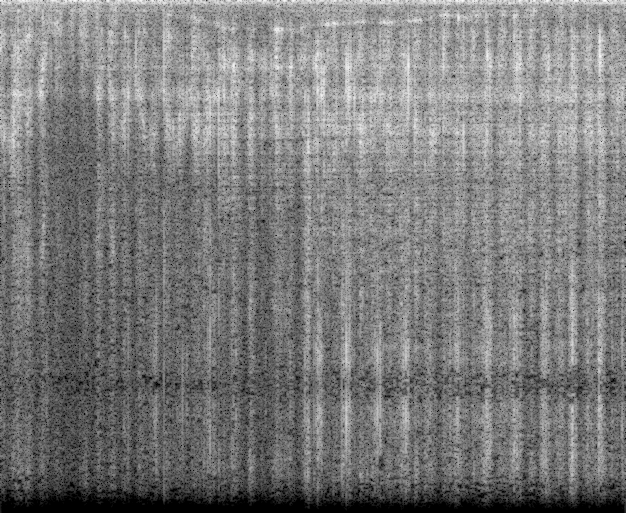

exp7
Class: brushing_teeth, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


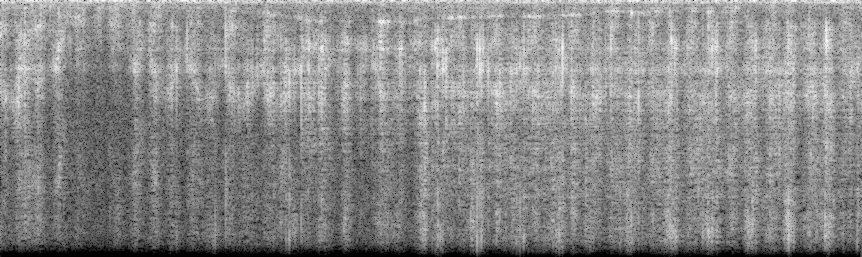

exp8
Class: brushing_teeth, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


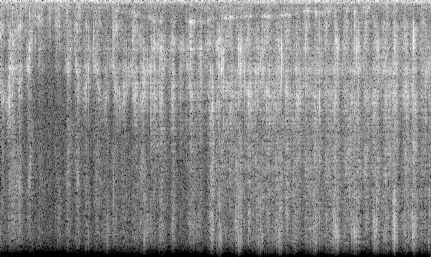

exp9
Class: brushing_teeth, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


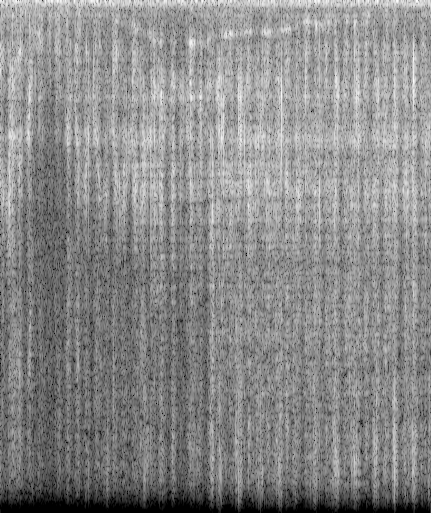

exp10
Class: brushing_teeth, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


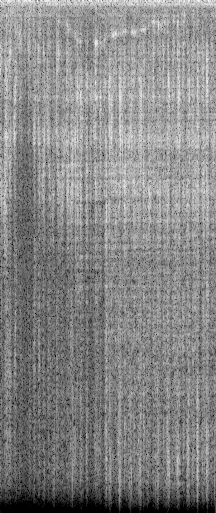

exp1
Class: can_opening, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


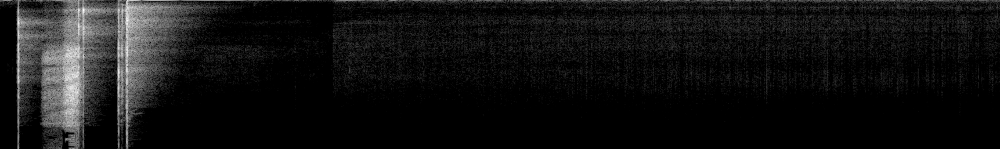

exp2
Class: can_opening, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


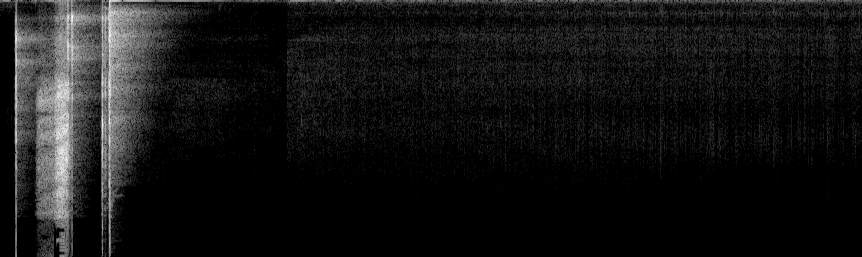

exp3
Class: can_opening, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


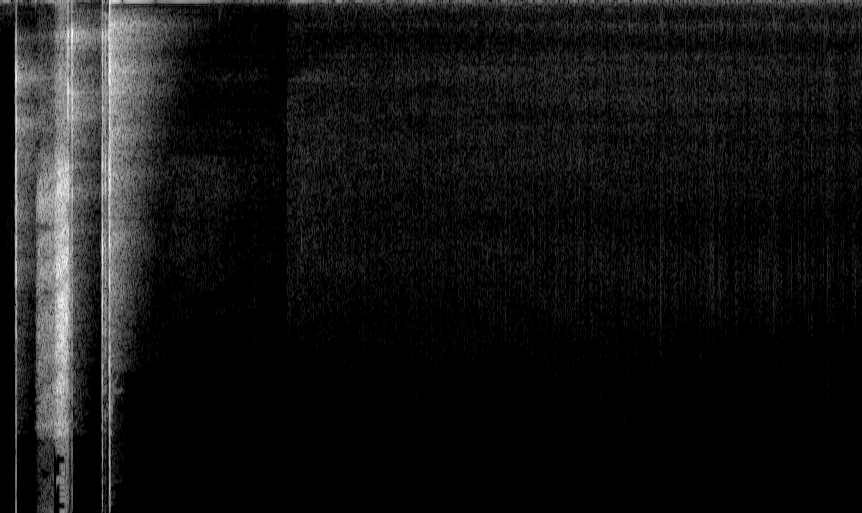

exp4
Class: can_opening, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


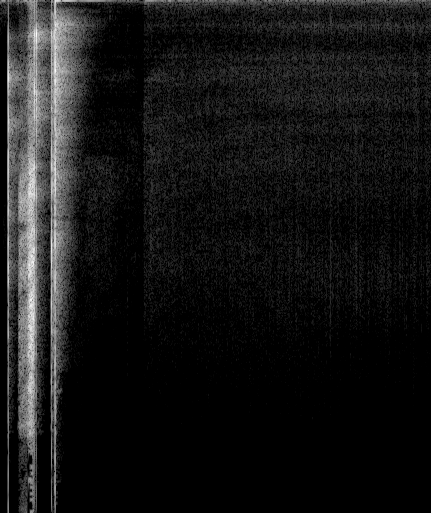

exp5
Class: can_opening, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


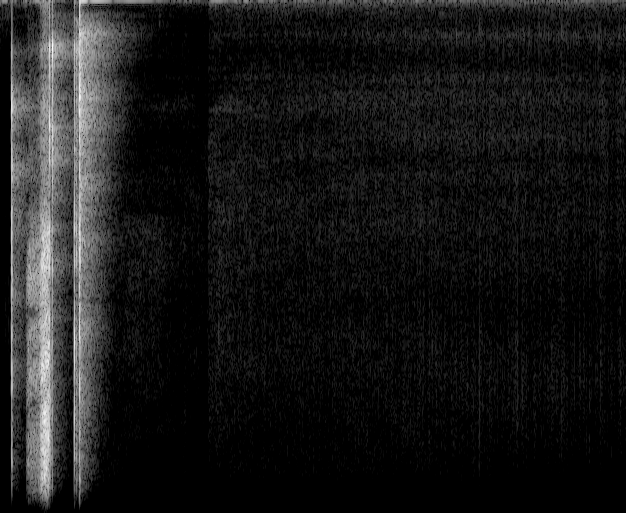

exp6
Class: can_opening, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


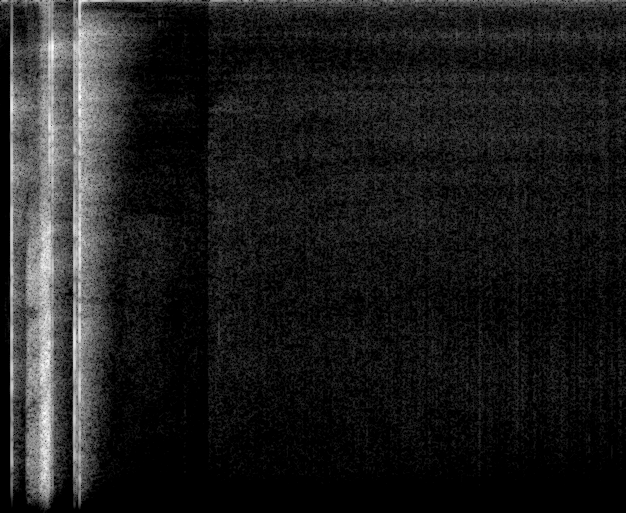

exp7
Class: can_opening, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


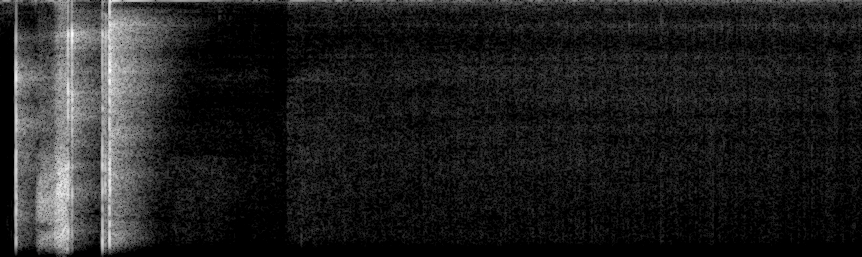

exp8
Class: can_opening, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


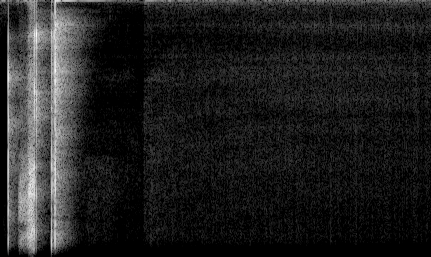

exp9
Class: can_opening, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


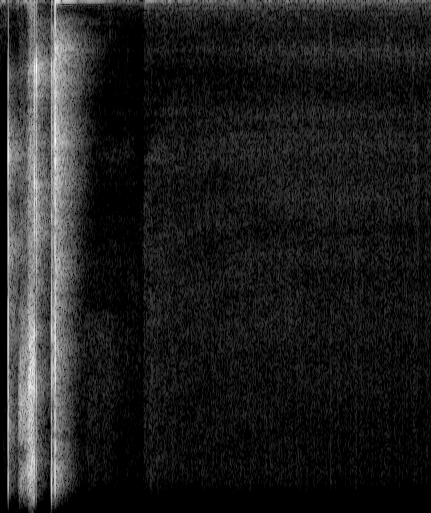

exp10
Class: can_opening, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


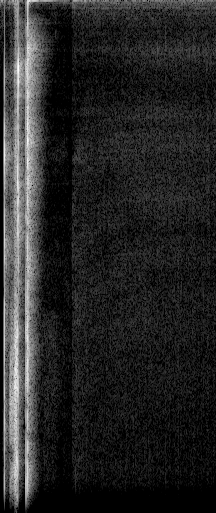

exp1
Class: car_horn, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


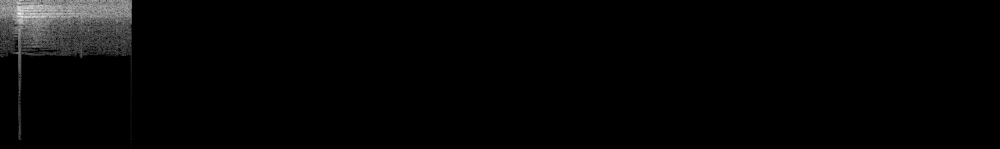

exp2
Class: car_horn, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


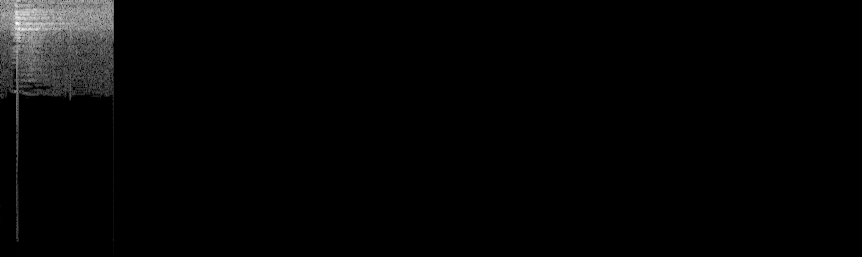

exp3
Class: car_horn, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


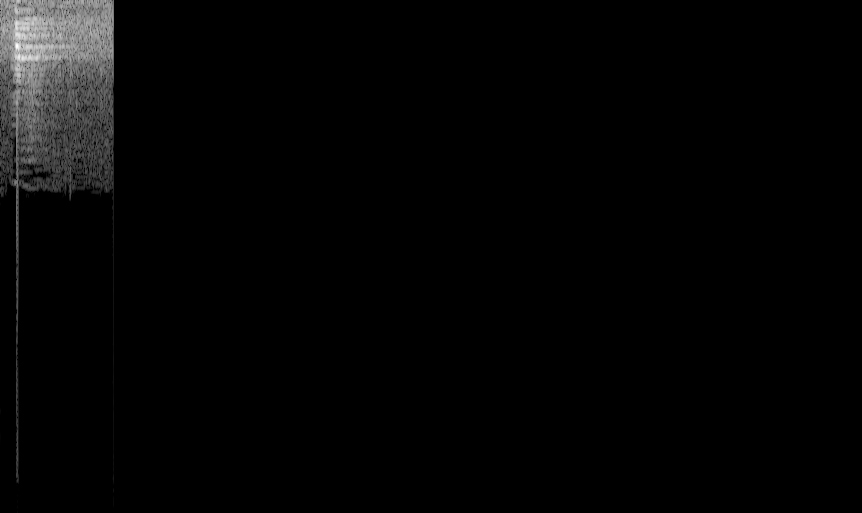

exp4
Class: car_horn, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


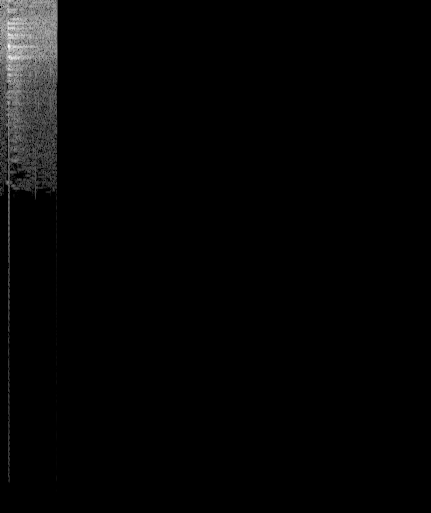

exp5
Class: car_horn, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


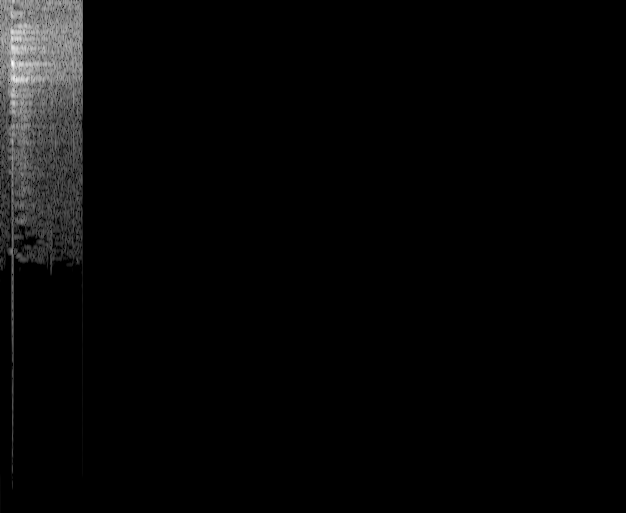

exp6
Class: car_horn, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


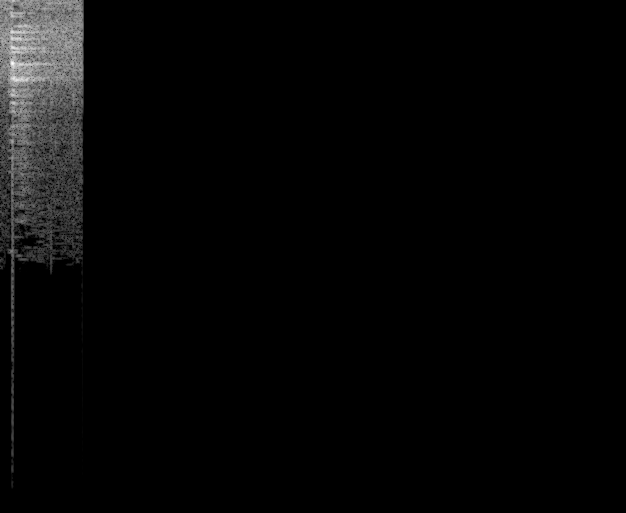

exp7
Class: car_horn, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


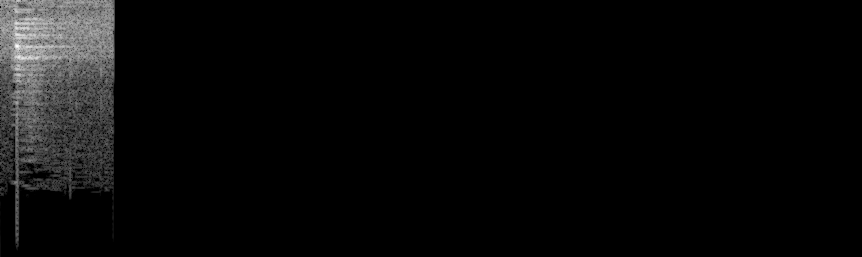

exp8
Class: car_horn, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


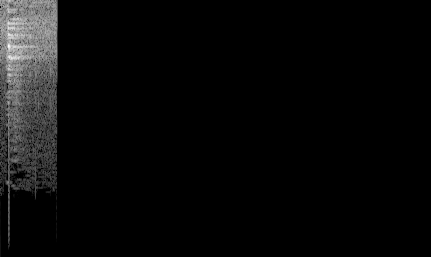

exp9
Class: car_horn, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


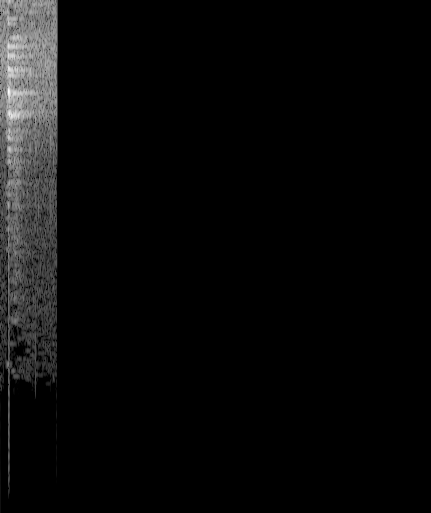

exp10
Class: car_horn, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


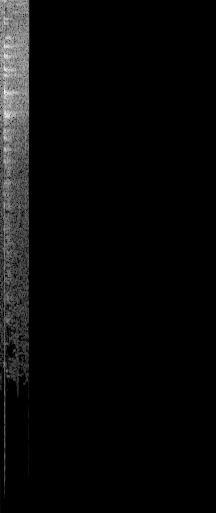

exp1
Class: cat, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


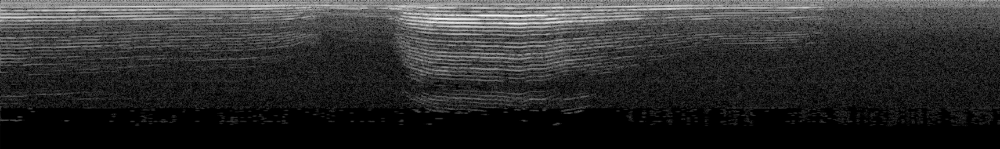

exp2
Class: cat, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


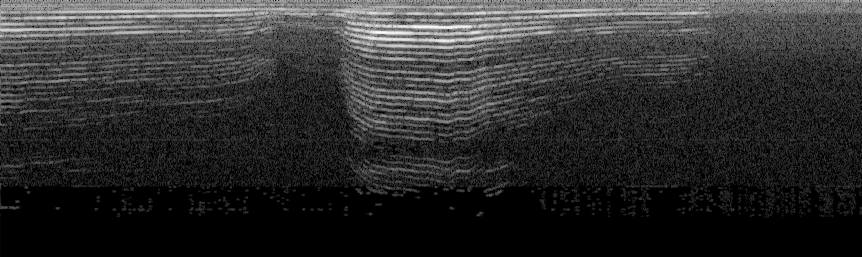

exp3
Class: cat, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


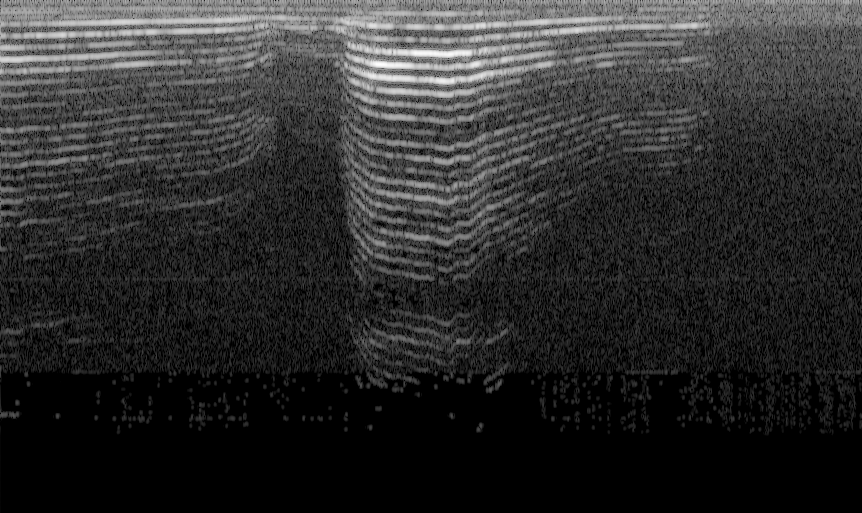

exp4
Class: cat, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


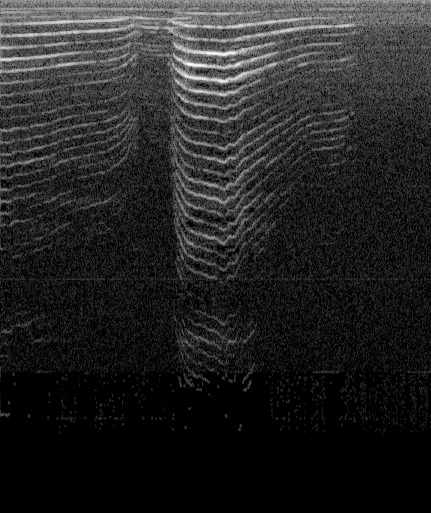

exp5
Class: cat, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


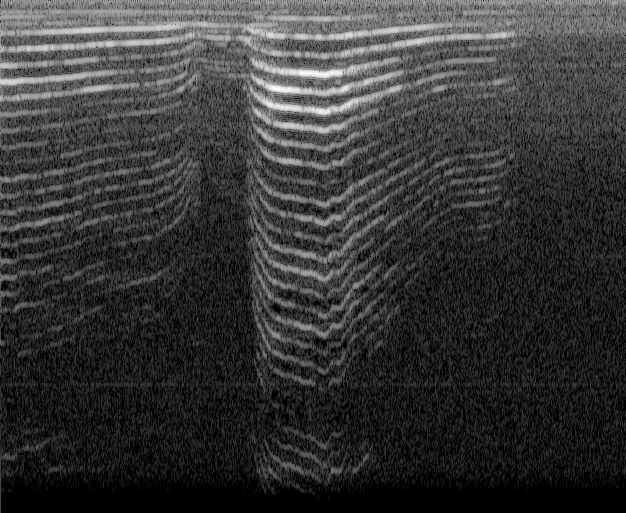

exp6
Class: cat, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


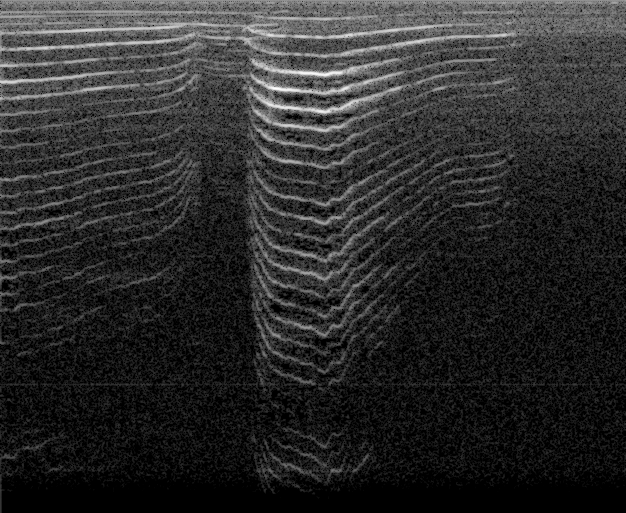

exp7
Class: cat, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


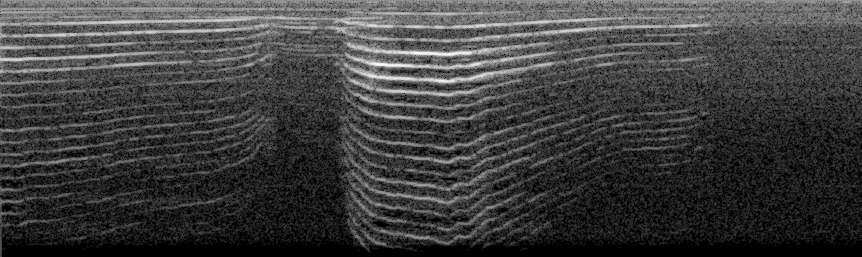

exp8
Class: cat, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


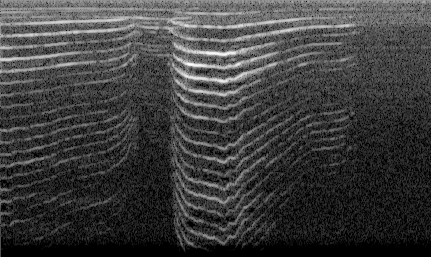

exp9
Class: cat, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


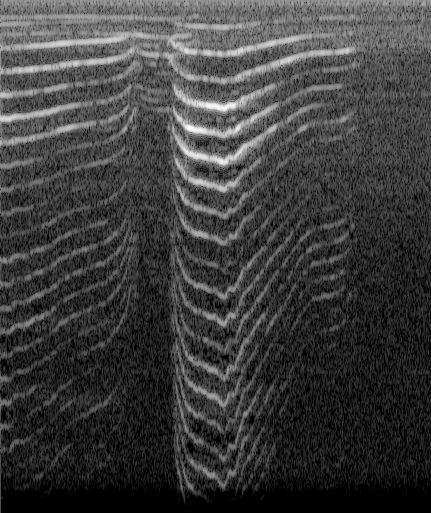

exp10
Class: cat, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


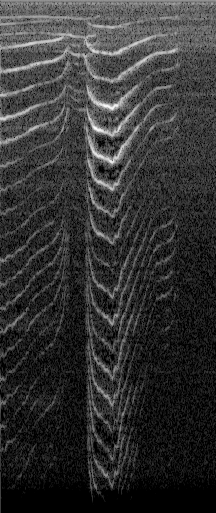

exp1
Class: chainsaw, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


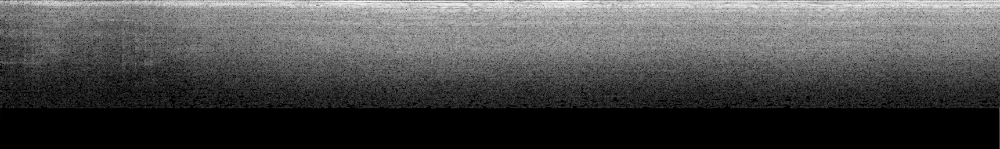

exp2
Class: chainsaw, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


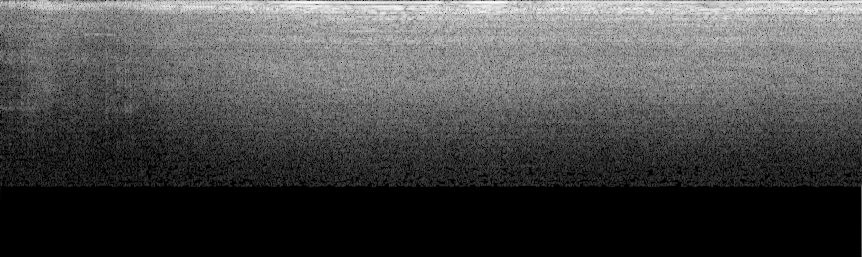

exp3
Class: chainsaw, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


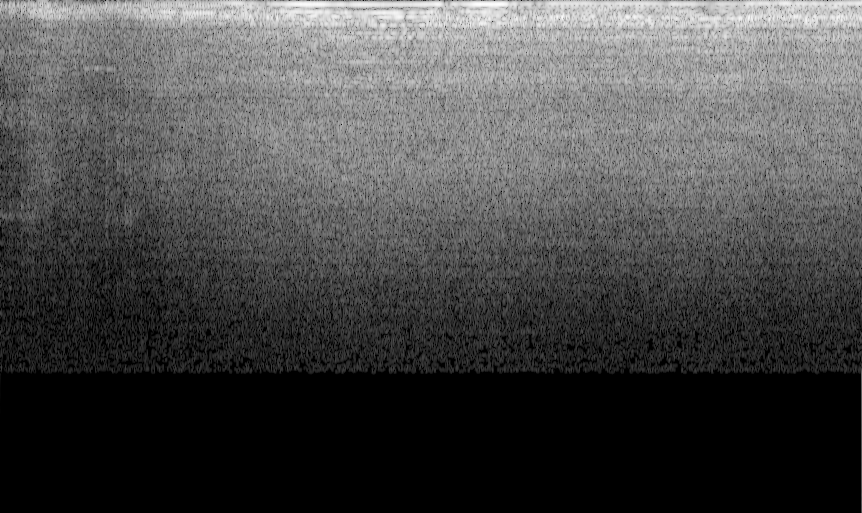

exp4
Class: chainsaw, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


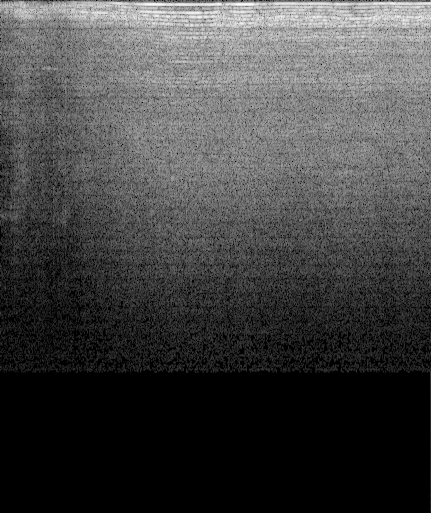

exp5
Class: chainsaw, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


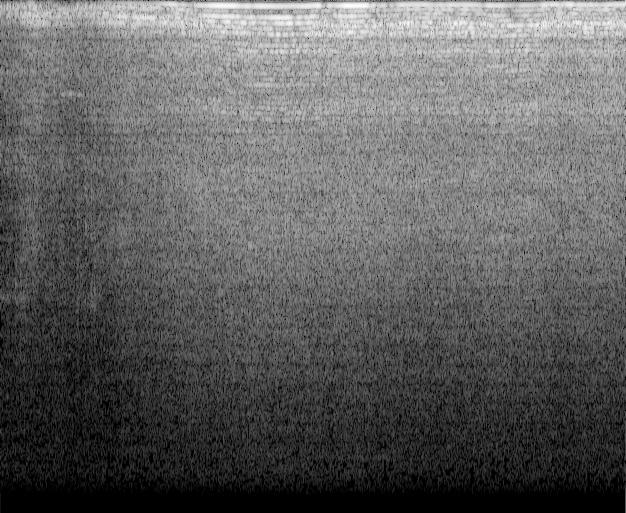

exp6
Class: chainsaw, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


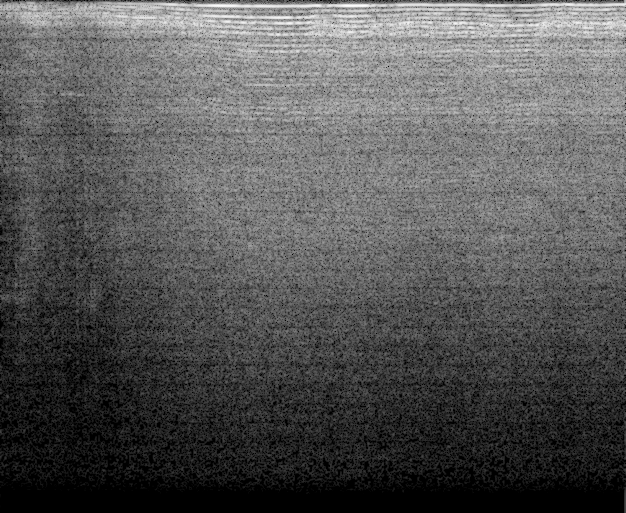

exp7
Class: chainsaw, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


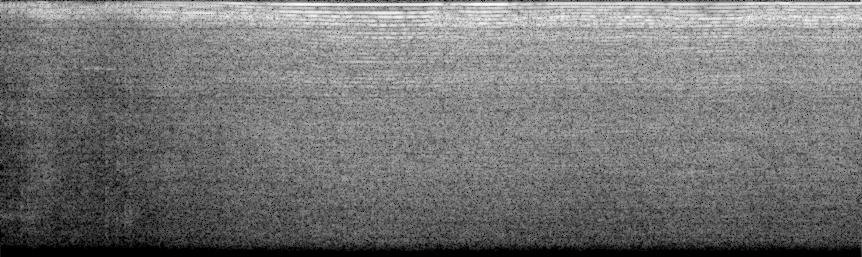

exp8
Class: chainsaw, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


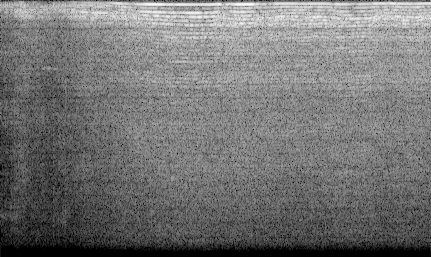

exp9
Class: chainsaw, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


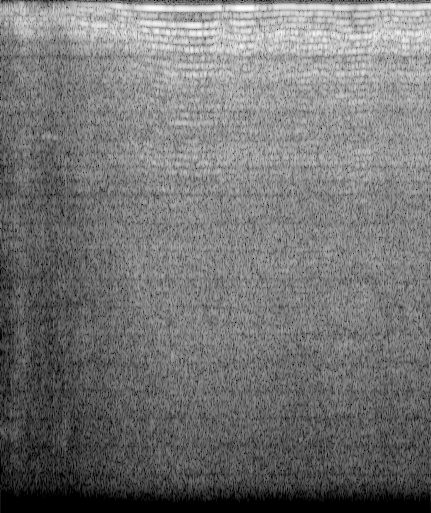

exp10
Class: chainsaw, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


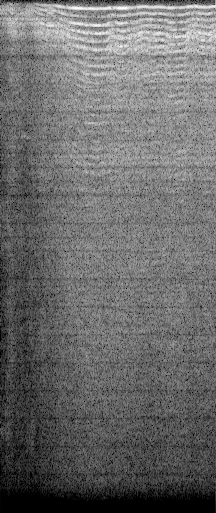

exp1
Class: chirping_birds, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


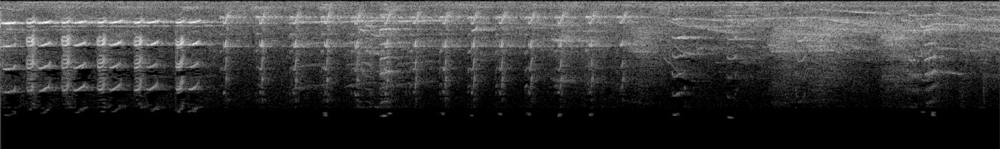

exp2
Class: chirping_birds, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


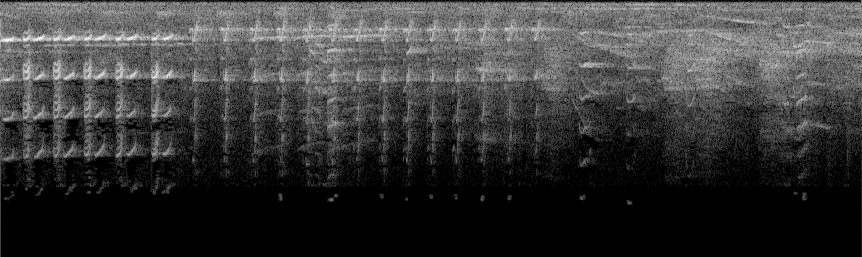

exp3
Class: chirping_birds, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


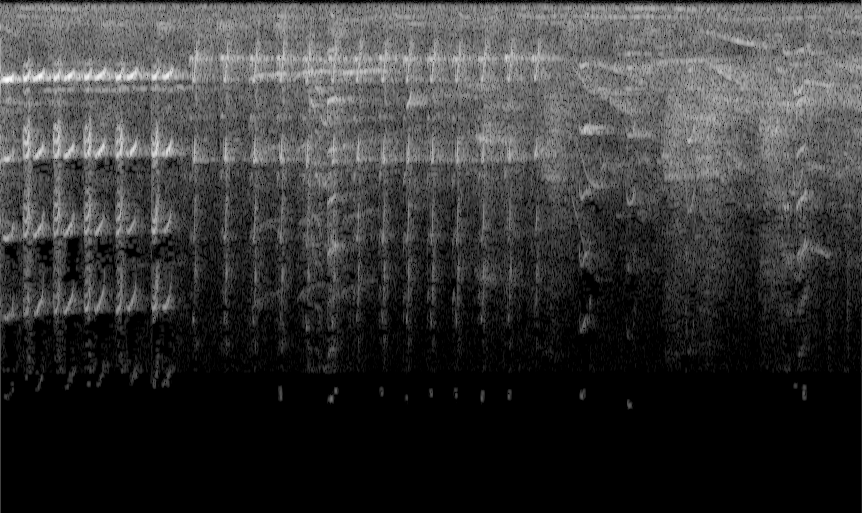

exp4
Class: chirping_birds, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


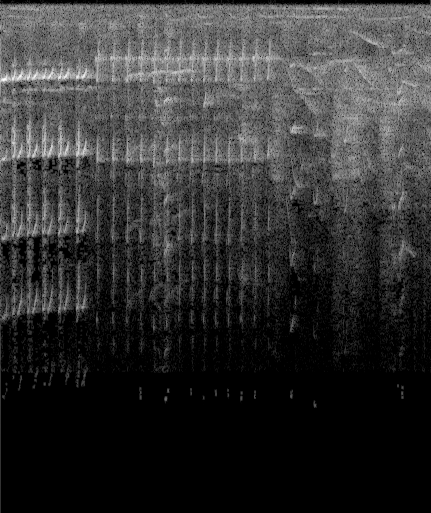

exp5
Class: chirping_birds, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


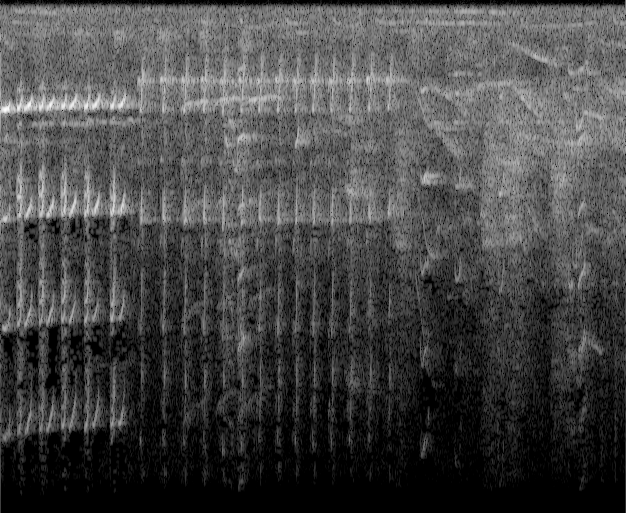

exp6
Class: chirping_birds, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


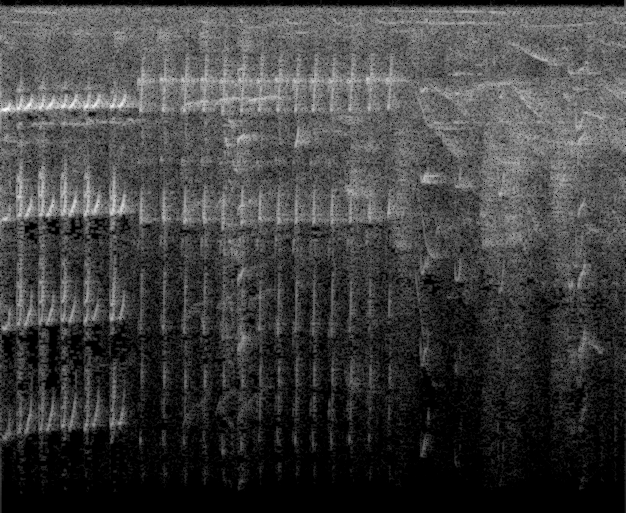

exp7
Class: chirping_birds, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


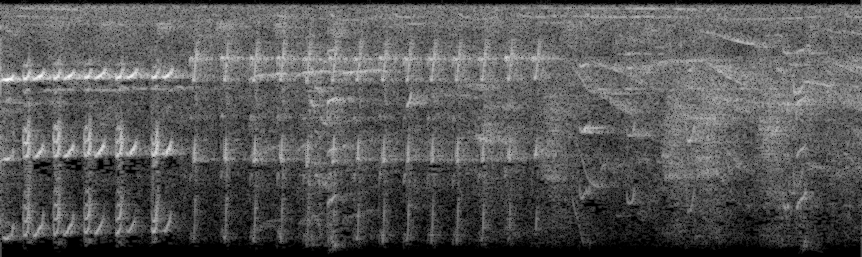

exp8
Class: chirping_birds, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


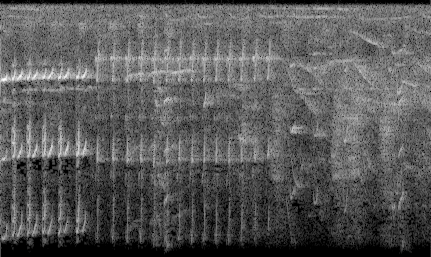

exp9
Class: chirping_birds, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


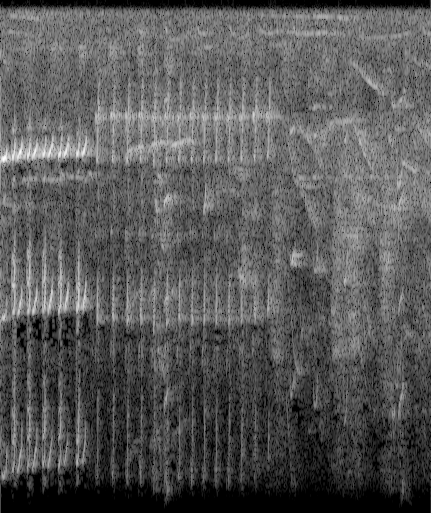

exp10
Class: chirping_birds, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


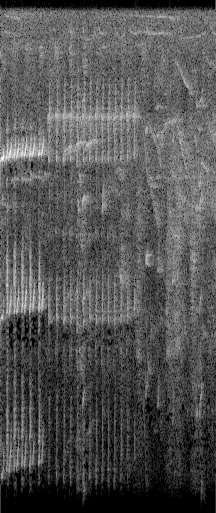

exp1
Class: church_bells, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


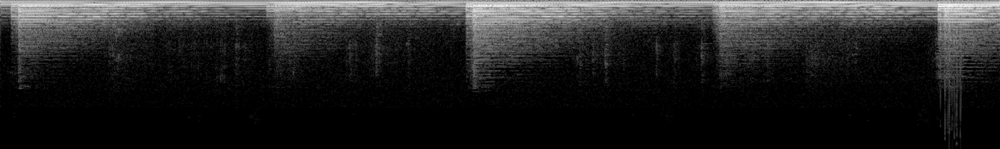

exp2
Class: church_bells, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


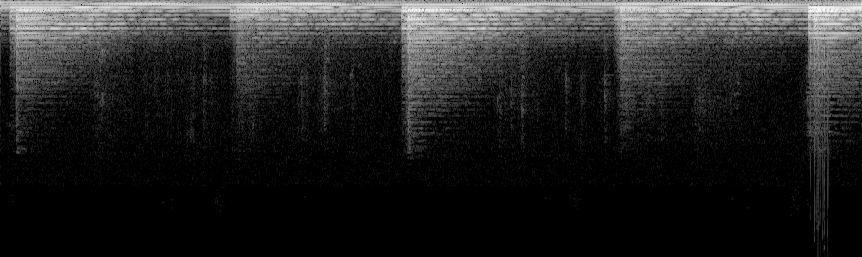

exp3
Class: church_bells, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


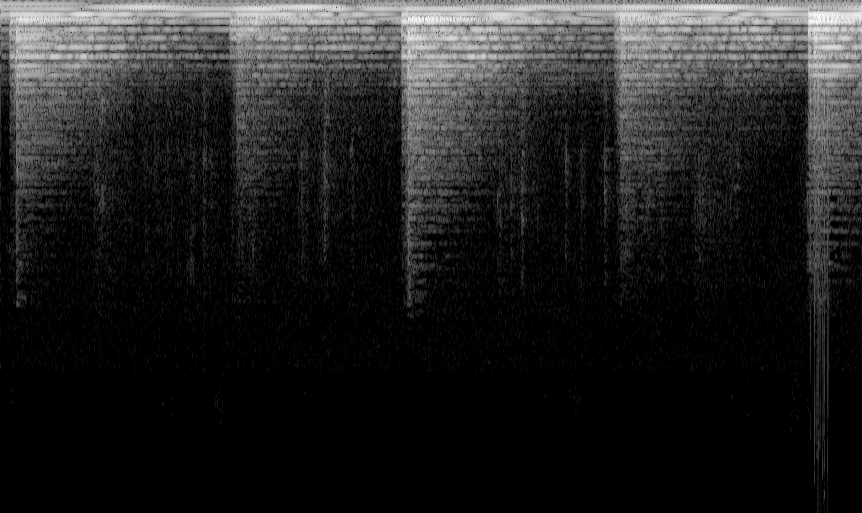

exp4
Class: church_bells, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


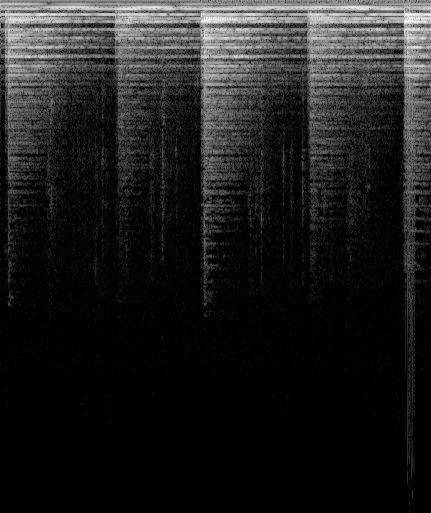

exp5
Class: church_bells, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


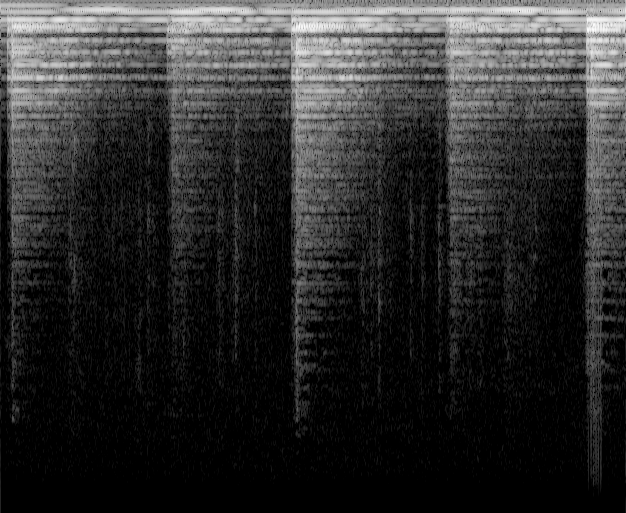

exp6
Class: church_bells, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


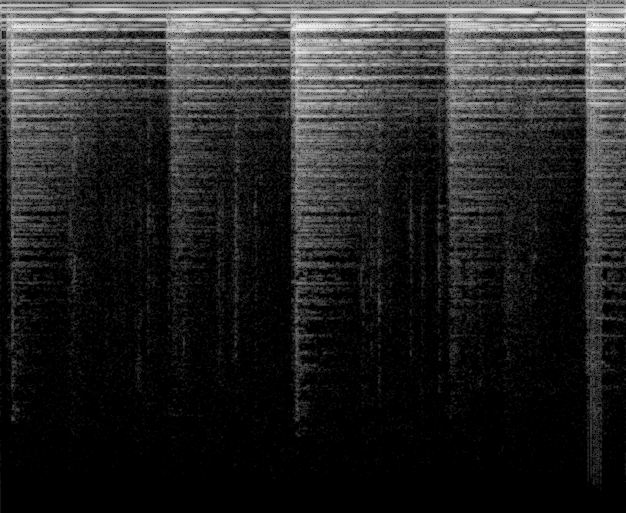

exp7
Class: church_bells, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


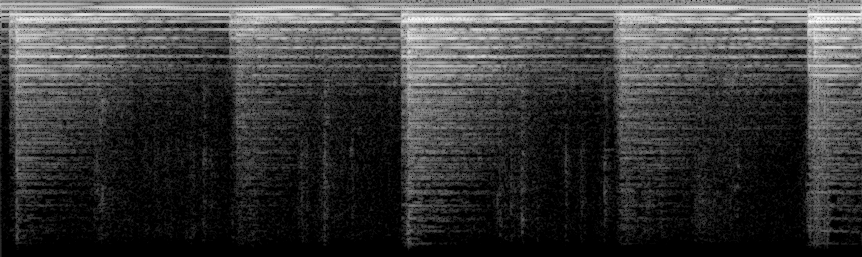

exp8
Class: church_bells, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


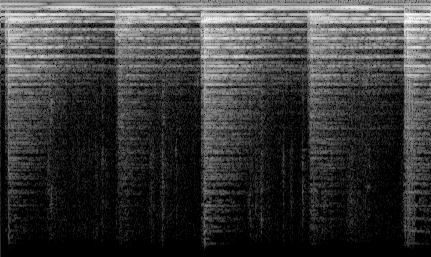

exp9
Class: church_bells, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


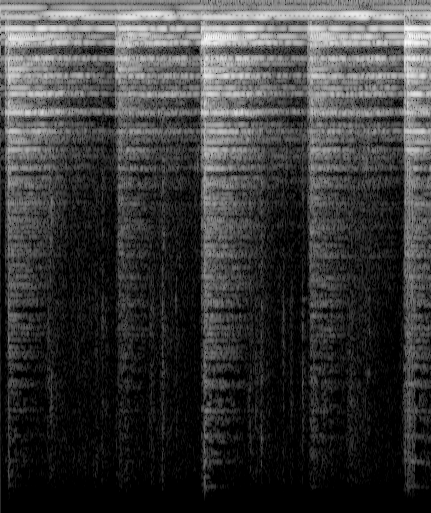

exp10
Class: church_bells, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


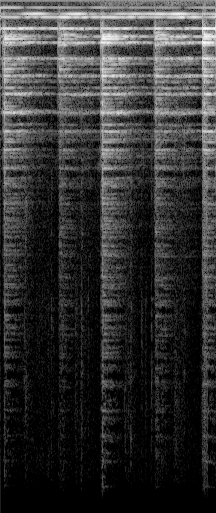

exp1
Class: clapping, experiment_no: exp1, shape: (257, 1723), parameters=[44100, 512, 512, 128]


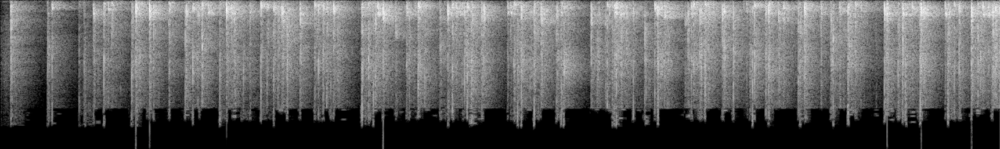

exp2
Class: clapping, experiment_no: exp2, shape: (257, 862), parameters=[44100, 512, 512, 256]


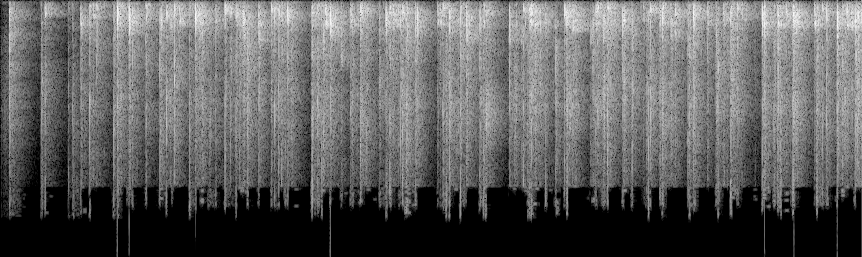

exp3
Class: clapping, experiment_no: exp3, shape: (513, 862), parameters=[44100, 1024, 512, 256]


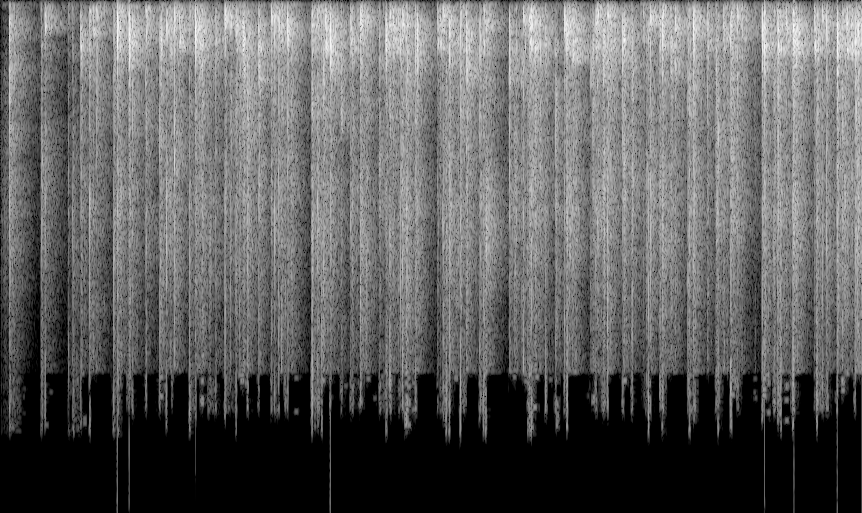

exp4
Class: clapping, experiment_no: exp4, shape: (513, 431), parameters=[44100, 1024, 1024, 512]


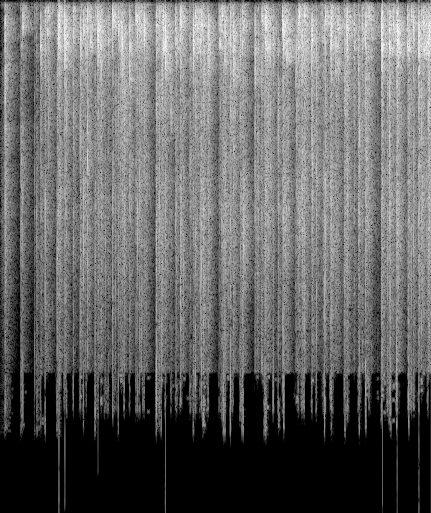

exp5
Class: clapping, experiment_no: exp5, shape: (513, 626), parameters=[32000, 1024, 512, 256]


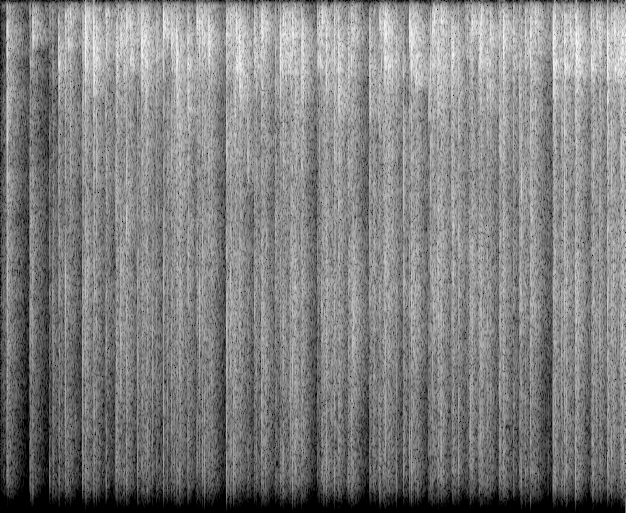

exp6
Class: clapping, experiment_no: exp6, shape: (513, 626), parameters=[32000, 1024, 1024, 256]


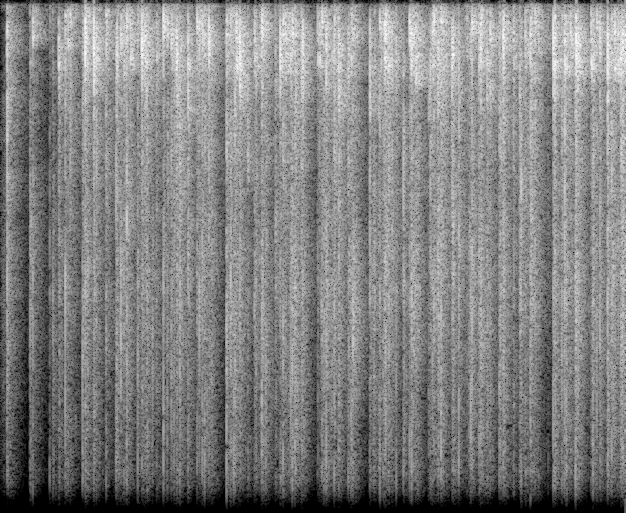

exp7
Class: clapping, experiment_no: exp7, shape: (257, 862), parameters=[22050, 512, 512, 128]


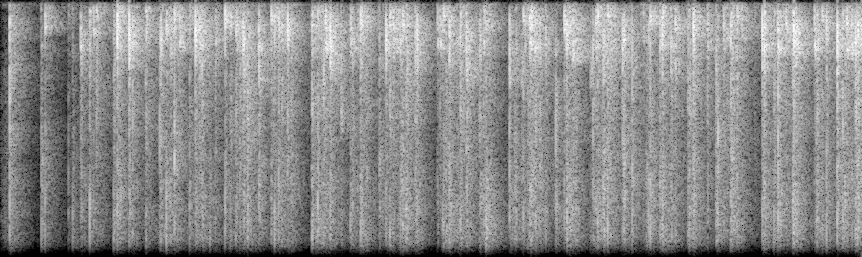

exp8
Class: clapping, experiment_no: exp8, shape: (257, 431), parameters=[22050, 512, 512, 256]


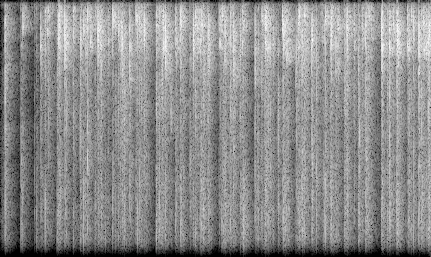

exp9
Class: clapping, experiment_no: exp9, shape: (513, 431), parameters=[22050, 1024, 512, 256]


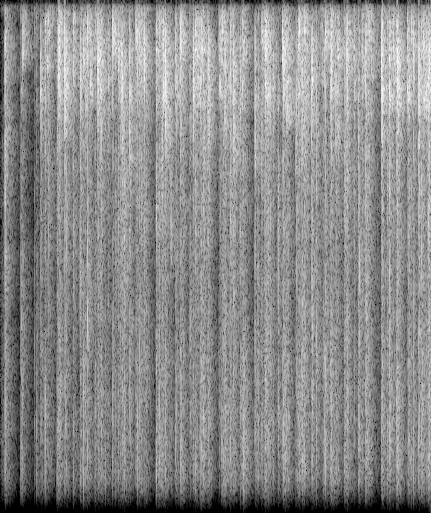

exp10
Class: clapping, experiment_no: exp10, shape: (513, 216), parameters=[22050, 1024, 1024, 512]


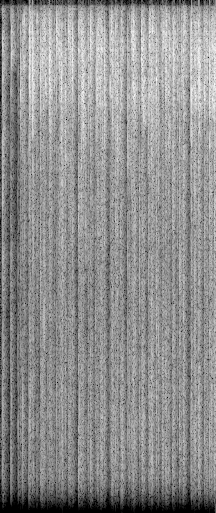

In [64]:
#Main
experiment_path='/content/exp/'
mode='stft1'
#mode='stft2'
#mode='stft3'

experiment_path=experiment_path+mode+'/'

for c in classes[0:10]:
  afn = esc50['filename'].loc[esc50['category']==c].iloc[0] #get the first file of the first 10 categories

  for exp in experiments.index:
    print(exp)
    sr, nfft, window_size, overlap = experiments.loc[exp] 
    parameters=[sr, nfft, window_size, overlap]     
    image_name=define_imagename_exp(afn,exp)
    
    #mode_1
    stft=extract_stfts(audio_path,afn,sr,window_size,overlap,nfft)
    #mode_2
    #stft=extract_stfts_2(audio_path,afn,sr)
    #mode_3
    #stft=extract_stfts_3(audio_path,afn,sr,window_size,overlap,nfft)



    image=stft_to_image(stft, eps=1e-6)

    save_spec(experiment_path,image_name,image)

    print('Class: {}, experiment_no: {}, shape: {}, parameters={}'.format(c,exp,image.shape,parameters))

    plot_experiments(experiment_path, stft, image_name)
 

Όπως διαφαίνεται στις εικόνες, μικρότερες τιμές χρονικού step(overlap) προσδίδουν μεγαλύτερη χρονική ευκρίνεια(μήκος), ενώ μεγαλύτερες τιμές για την παράμετρο fft points(nfft), προσδίδουν μεγαλύτερη φασματική ευκρίνεια(πλάτος) στις εικόνες. 
Επιπρόσθετα, η τελευταία ελλατώνεται δραστικά, ως γνωστόν κατά την υποδειγματοληψία, βάσει θεωρήματος Nyquist. 

In [ ]:
#compress the file
!tar -zcvf chose_parameters[stfts].tar.gz /content/exp/
!rm -rf /content/exp

In [78]:
#exp4  shape: (513, 431), parameters=[44100, 1024, 1024, 512]   finally were selected for extraction
#exp5  shape: (513, 626), parameters=[32000, 1024, 512, 256]
#exp8  shape: (257, 431), parameters=[22050, 512, 512, 256]     alternative parameters with different window size
#exp9  shape: (513, 431), parameters=[22050, 1024, 512, 256]

sr=44100   
window_size=1024   #duration_of_window(secs)=T=WindowSize/SR==23ms , F0=5*(SR/Window Size)=116Hz
nfft=1024	          #fftanalysis_window=WindowSize/SR=23ms
overlap=int(window_size/2)#50% = 512 samples

In [67]:
esc50.set_index('filename',inplace=True)

In [86]:
#Feature extraction
extraction_path='/content/gdrive/My Drive/dissertation/ESC-50-master/features/stfts/exp4/'

for afn in tqdm(esc50.index):
  image_name=define_imagename_exp(afn,exp)
  stft=extract_stfts(audio_path,afn,sr,window_size,overlap,nfft)
  image=stft_to_image(stft, eps=1e-6)
  save_spec(extraction_path,image_name,image)


check=len(os.listdir(extraction_path))
percentage=int((check//len(esc50))*100)
print('{} files out of {}, {}%_complete'.format(check,len(esc50),percentage))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.



2000 files out of 2000, 100%_complete


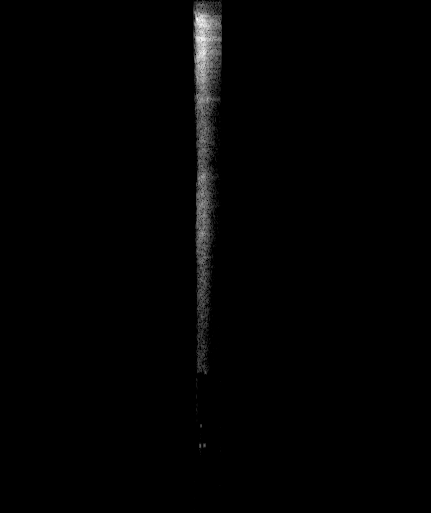

1-100032-A-0_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


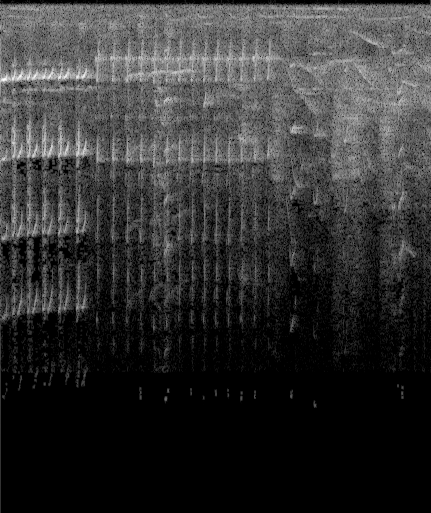

1-100038-A-14_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[38  0  0 ...  0 15 70]
 [40 14 21 ...  0 12 63]
 [ 0 13 13 ...  9 12 66]
 ...
 [49  0  0 ...  0  0  0]
 [49  0  0 ...  0  0  0]
 [49  0  0 ...  0  0  0]]


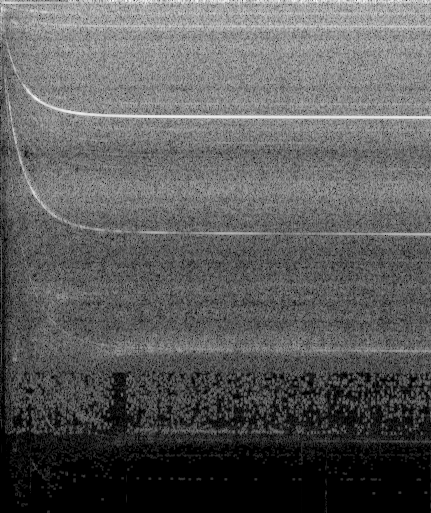

1-100210-A-36_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[167 178 183 ... 170 177 213]
 [182 149 189 ... 206 197 204]
 [181 183 199 ... 217 187 187]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0  16]
 [  0   0   0 ...   0   0  20]]


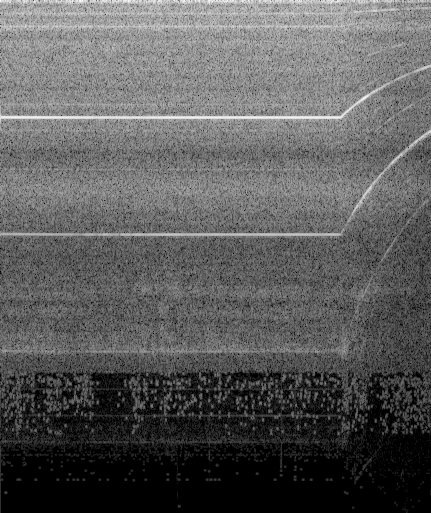

1-100210-B-36_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[255 208 233 ... 184 149 183]
 [241 223 211 ... 173 164 182]
 [197 199 179 ... 141 153 159]
 ...
 [ 47   0   0 ...   0   0   0]
 [ 46   0   0 ...   0   0   0]
 [ 46   0   0 ...   0   0   0]]


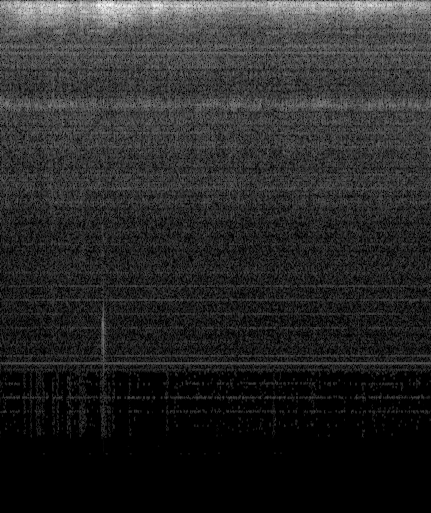

1-101296-A-19_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[ 28  93  94 ... 123  83  74]
 [124 135 110 ... 113 114 113]
 [153 141 162 ... 151 135 138]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


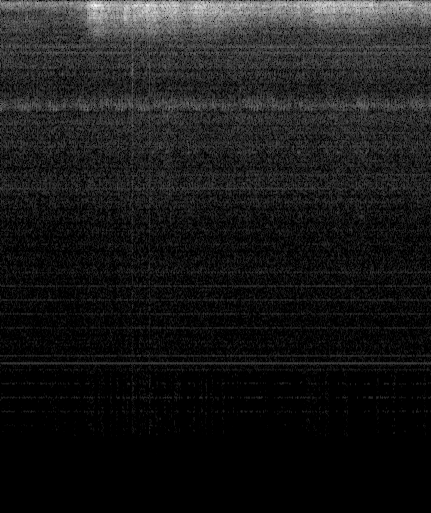

1-101296-B-19_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[132  48  85 ...  58  71  91]
 [134  68 111 ... 122 121 108]
 [122 126  80 ...  94 149 113]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


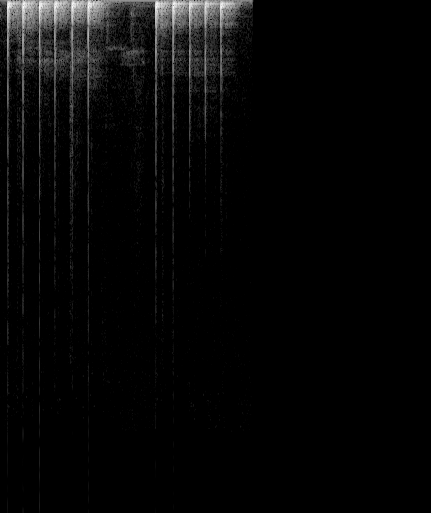

1-101336-A-30_exp10.png
(513, 431)
<class 'numpy.ndarray'>
[[114 118 117 ...   0   0   0]
 [ 87 100 103 ...   0   0   0]
 [ 51  81  89 ...   0   0   0]
 ...
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]]


In [90]:
#Retrieve a few
for afn in esc50.index[0:7]:
  image=read_image(extraction_path,define_imagename_exp(afn,exp))